In [1]:
import seaborn as sns
import matplotlib.pyplot as plt

import pandas as pd
import numpy as np

try:
    import cPickle as pickle
except ImportError:
    import pickle

%matplotlib inline

sns.set_context("paper")
sns.set_style("whitegrid")
sns.set_palette("Set1")

# Dataset 

## Información general
eNTERFACE05 | eNTERFACE05
--- | --- 
Idioma | English
Muestras | 1287
Emociones | anger disgust fear happiness sadness surprise
Nº de actores | 43 (34H 9M) (from 14 different nationalities)
Naturaleza | Simulada
URLs | [Documentación](http://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.220.2113&rep=rep1&type=pdf)


**Archivos**

carcterística | valor
--- | --- 
codec | PCM S16 LE
channels | Mono
sample rate  | 16000 Hz
bit rate | 16 kbps


## Selección de muestras
Emociones de estudio
- anger 
- disgust 
- fear 
- happiness 
- sadness

Cargando el objeto del dataset

In [4]:
dataset = "enterface-0.025-01234"
dataset_path = "/home/mike/PycharmProjects/tfm-project/data/" + dataset + "/"
print("Loading data from " + dataset + " data set...")
ds = pickle.load(open(dataset_path + dataset + '_db.p', 'rb'))
number_instances = len(ds.targets)

Loading data from enterface-0.025-01234 data set...


**Número de instancias**

In [5]:
print("Number of instances: " + str(number_instances))

Number of instances: 1072


**Distribución de duración** de los audios

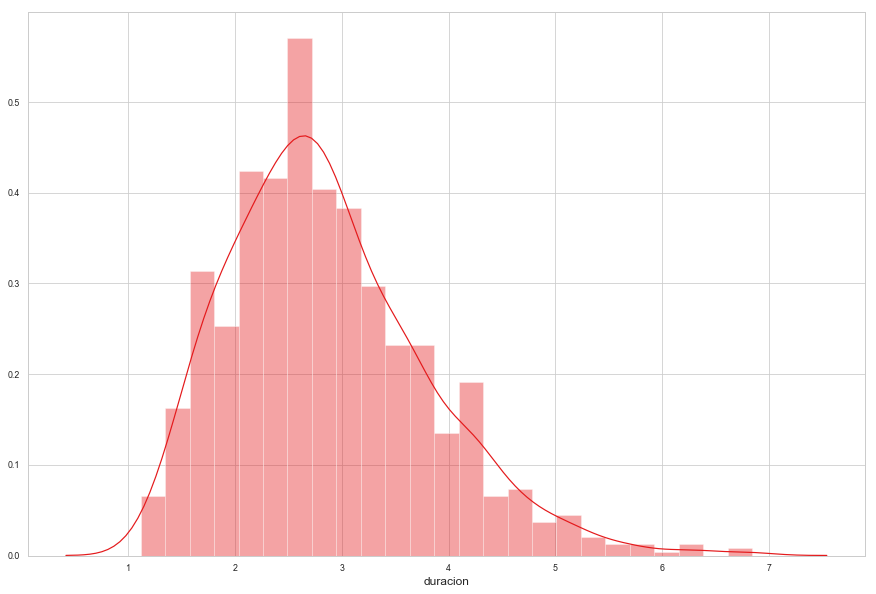

In [6]:
duracion = []
for i in range(0, number_instances):
    duracion.append((ds.data[i][0].size) / 16000)

df_duracion = pd.Series(data=duracion, name="duracion")

plt.rcParams['figure.figsize'] = (15.0, 10.0)
plt.rcParams['axes.titlesize'] = 'large'
plt.rcParams['axes.labelsize'] = 'large'

sns.distplot(df_duracion)

Numero de **muestras por emoción**:

In [7]:
df_emotions = pd.Series(data=ds.targets, name="emotion", dtype="category")
df_emotions = df_emotions.map(lambda i: ds.dictionary[i])
df_emotions.value_counts()

sadness      215
fear         215
disgust      215
anger        215
happiness    212
Name: emotion, dtype: int64

**Distribución de duración según la emoción**

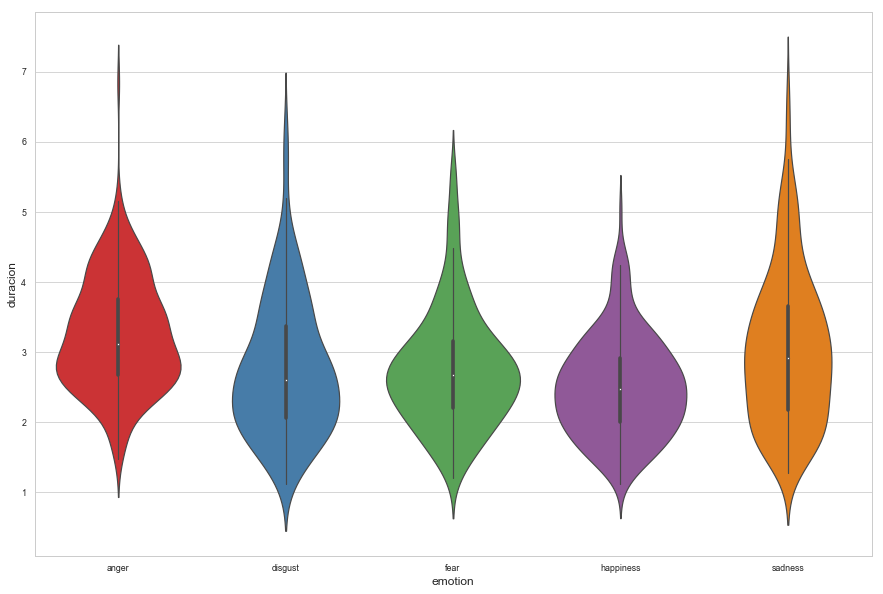

In [8]:
df_aux = pd.concat([df_emotions, df_duracion], axis=1)
sns.violinplot(x=df_aux["emotion"], y=df_aux["duracion"])

## Selección de la longitud de ventana de muestreo

In [12]:
dataset_no_frame_size="enterface-01234"
df_compare_frame_size = pd.read_csv('data/compare_frame_size_csv/' + dataset_no_frame_size +
                                    '.csv')
df_compare_frame_size.head()

,zcr,energy,energy_entropy,spectral_centroid,spectral_spread,spectral_entropy,spectral_flux,spectral_rolloff,mfcc_1,mfcc_2,...,chroma_8,chroma_9,chroma_10,chroma_11,chroma_12,chroma_std,harmonic_ratio,pitch,frame_size,emotion
0,-0.087833,-0.096512,0.060595,-0.083260,-0.085574,-0.024426,-0.096986,-0.080972,-1.773862,-0.213034,...,-0.096294,-0.097242,-0.096990,-0.095745,-0.097285,-0.096257,-0.082256,5.108103,0.015,anger
1,-0.057328,-0.073118,0.122287,-0.052658,-0.058378,0.031058,-0.073541,-0.046336,-2.163288,-0.224399,...,-0.072885,-0.073776,-0.073525,-0.072153,-0.073835,-0.072807,-0.060328,4.673629,0.015,disgust
2,-0.072297,-0.085061,0.091283,-0.067571,-0.071871,0.001234,-0.085546,-0.063351,-1.978204,-0.211385,...,-0.084880,-0.085840,-0.085634,-0.083982,-0.085861,-0.084719,-0.071001,4.886987,0.015,fear
3,-0.061066,-0.075464,0.114019,-0.056461,-0.061766,0.022548,-0.075985,-0.051563,-2.093373,-0.226573,...,-0.075374,-0.076244,-0.075928,-0.074715,-0.076257,-0.075240,-0.063140,4.703617,0.015,happiness
4,-0.072723,-0.084849,0.095138,-0.067334,-0.070801,-0.000438,-0.085113,-0.063543,-2.051254,-0.205423,...,-0.084491,-0.085454,-0.085250,-0.083363,-0.085487,-0.084179,-0.069845,4.931644,0.015,sadness


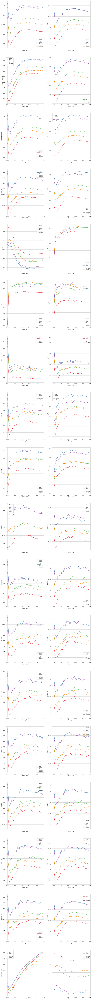

In [13]:
plt.rcParams['figure.figsize'] = (15.0, 180.0)
i=1
for column in df_compare_frame_size.drop(["frame_size", "emotion"], axis=1):
    plt.subplot(18,2,i)
    sns.lineplot(x="frame_size",
                 y=column,
                 hue="emotion",
                 data=df_compare_frame_size)
    i+=1
plt.show()

plt.rcParams['figure.figsize'] = (15.0, 10.0)

# Características

Cargando el array tridimensional de características

In [14]:
label_features = [
    'zcr', 'energy', 'energy_entropy', 'spectral_centroid', 'spectral_spread',
    'spectral_entropy', 'spectral_flux', 'spectral_rolloff', 'mfcc_1',
    'mfcc_2', 'mfcc_3', 'mfcc_4', 'mfcc_5', 'mfcc_6', 'mfcc_7', 'mfcc_8',
    'mfcc_9', 'mfcc_10', 'mfcc_11', 'mfcc_12', 'mfcc_13', 'chroma_1',
    'chroma_2', 'chroma_3', 'chroma_4', 'chroma_5', 'chroma_6', 'chroma_7',
    'chroma_8', 'chroma_9', 'chroma_10', 'chroma_11', 'chroma_12',
    'chroma_std', 'harmonic_ratio', 'pitch'
]

print("Loading features from file...\n")
features = pickle.load(open(dataset_path + dataset + '_features.p', 'rb'))

Loading features from file...



Creando un **dataframe con MultiIndex** a partir del objeto tridimensional

In [15]:
df = pd.DataFrame()
audio_index = []
row_index = []
i = 0
for single_audio in features:
    audio_index = np.full(shape=len(single_audio), fill_value=i)
    row_index = np.arange(len(single_audio))
    index_df = pd.DataFrame({"audio_number": audio_index, "row": row_index})

    single_audio_df = pd.DataFrame(single_audio, columns=label_features)

    aux_df = pd.concat([index_df, single_audio_df], axis=1)

    df = pd.concat([df, aux_df], axis=0, ignore_index=True)
    i += 1

df = df.set_index(["audio_number", "row"])
df

zcr    energy  energy_entropy  spectral_centroid  \
audio_number row                                                          
0            0   -0.110546 -0.119339        0.049184          -0.103890   
             1   -0.117454 -0.126163        0.016296          -0.113230   
             2   -0.070446 -0.091775        0.174296          -0.065846   
             3   -0.073549 -0.088920        0.163296          -0.064661   
             4   -0.112654 -0.120768        0.051506          -0.105512   
             5   -0.076399 -0.092127        0.161783          -0.068393   
             6   -0.076131 -0.092097        0.174565          -0.067604   
             7   -0.077423 -0.091940        0.172185          -0.066917   
             8   -0.090660 -0.102981        0.119811          -0.082588   
             9   -0.102482 -0.115430        0.070607          -0.097691   
             10   0.171921  0.120842        0.658021           0.197868   
             11  -0.119600 -0.130797        0.021119          -0.110213   
             12  -0.072839 -0.092807        0.169107          -0.065397   
             13  -0.087567 -0.104799        0.107019          -0.082689   
             14  -0.092970 -0.102056        0.120437          -0.079367   
             15  -0.091760 -0.104123        0.114632          -0.081289   
             16  -0.093566 -0.109511        0.092502          -0.089333   
             17  -0.166422 -0.167147       -0.163787          -0.166419   
             18  -0.150318 -0.159476       -0.040487          -0.147296   
             19  -0.129741 -0.136848        0.002312          -0.125533   
             20   0.168253  0.133506        0.893396           0.184257   
             21  -0.110813 -0.119984        0.138089          -0.108836   
             22  -0.108999 -0.111290        0.167232          -0.100554   
             23  -0.111635 -0.115589        0.151791          -0.104374   
             24  -0.106895 -0.115861        0.166639          -0.097276   
             25  -0.137249 -0.144246        0.002376          -0.135560   
             26  -0.100063 -0.113567        0.171683          -0.094670   
             27  -0.132877 -0.137310        0.014304          -0.128140   
             28  -0.105832 -0.114252        0.137867          -0.097321   
             29  -0.135059 -0.141506        0.012693          -0.131631   
...                    ...       ...             ...                ...   
1071         218 -0.091753 -0.100203        0.165337          -0.085192   
             219 -0.097627 -0.104682        0.154069          -0.090985   
             220 -0.116438 -0.120493        0.080564          -0.112305   
             221 -0.151189 -0.152241       -0.083529          -0.149028   
             222 -0.094462 -0.099629        0.158823          -0.087054   
             223 -0.091762 -0.097497        0.152656          -0.084623   
             224 -0.091972 -0.096609        0.161001          -0.082688   
             225 -0.094231 -0.099750        0.156653          -0.088644   
             226 -0.150533 -0.152777       -0.081684          -0.148496   
             227 -0.124629 -0.130763        0.018930          -0.121893   
             228 -0.148704 -0.151042       -0.084452          -0.147346   
             229 -0.085656 -0.092371        0.161370          -0.078775   
             230 -0.093270 -0.099619        0.152591          -0.085919   
             231 -0.092507 -0.098223        0.150944          -0.084503   
             232 -0.128345 -0.131648        0.012666          -0.123436   
             233 -0.110724 -0.115919        0.072935          -0.105840   
             234 -0.110615 -0.117305        0.070938          -0.106748   
             235 -0.129418 -0.133911       -0.001917          -0.126205   
             236 -0.109500 -0.115075        0.084611          -0.103934   
             237 -0.084641 -0.092467        0.168198          -0.077751   
             238 -0.149191 -0.150912       -0.08

La **información mutua** entre dos variables aleatorias es un valor no negativo, que mide la dependencia entre las variables. Es igual a cero si y solo si dos variables aleatorias son independientes, y los valores más altos significan una mayor dependencia.


In [16]:
from sklearn.feature_selection import mutual_info_classif

x = df.groupby("audio_number").mean()
y = ds.targets
mi = mutual_info_classif(x, y, discrete_features="auto")
df_mi = pd.DataFrame(data=mi,columns=["values"])
df_mi["names"]= x.columns.tolist()
df_mi.sort_values(by="values",ascending=False)

,values,names
9,0.125849,mfcc_2
25,0.102302,chroma_5
35,0.085816,pitch
2,0.085714,energy_entropy
33,0.084968,chroma_std
23,0.080715,chroma_3
7,0.076360,spectral_rolloff
1,0.074784,energy
26,0.074149,chroma_6
19,0.072139,mfcc_12


Función para la **representación de los boxplot de cada caraterística**

In [17]:
def display_boxplot(feature, df, df_emotions):
    df_features_mean = pd.DataFrame(columns=label_features)
    for i in range(0, df_emotions.size):
        df_features_mean = df_features_mean.append(df.loc[i].mean(),
                                                   ignore_index=True)
    df_aux = pd.concat([df_emotions, df_features_mean], axis=1)

    sns.boxplot(x=df_aux["emotion"], y=df_aux[feature])
    plt.xlabel("emotion", fontsize=20)
    plt.ylabel(feature, fontsize=20)
    plt.tick_params(labelsize=17)

    

In [18]:
print("Sujetos disponibles: [0," + str(len(ds.subjects) - 1) + "]")

Sujetos disponibles: [0,43]


Dado subjeto y característica, la función muestra la evolución de la característica en un audio (que representa cada emoción)

In [19]:
#Busco un audio que represente cada emoción del sujeto seleccionado

def one_subject_one_feature(subject, feature):
    df_one_subject = pd.DataFrame()

    for emotion in ds.emotions:  #for para recorrer las emociones
        for audio in ds.subjects[subject]:  
            if ds.targets[audio] == emotion:  # si el audio corresponde a la emocion deseada, lo guardamos y cambiamos de emocion
                row = df.loc[audio, :][feature]
                df_one_subject = pd.concat([df_one_subject, row],
                                           axis=1,
                                           ignore_index=True)
                break

    df_one_subject.columns = ds.dictionary.values()
    for emotion in df_one_subject.columns:
        plt.plot(df_one_subject[emotion])
        plt.title('Subject number '+str(subject))
        plt.xlabel("frame")
        plt.ylabel(feature)
    plt.legend()     
    plt.show()   


## Zero Crossing Rate (zcr)

ZCR calcula el **promedio ponderado de la cantidad de veces que la señal de voz cambia de signo** dentro de una ventana de tiempo particular.


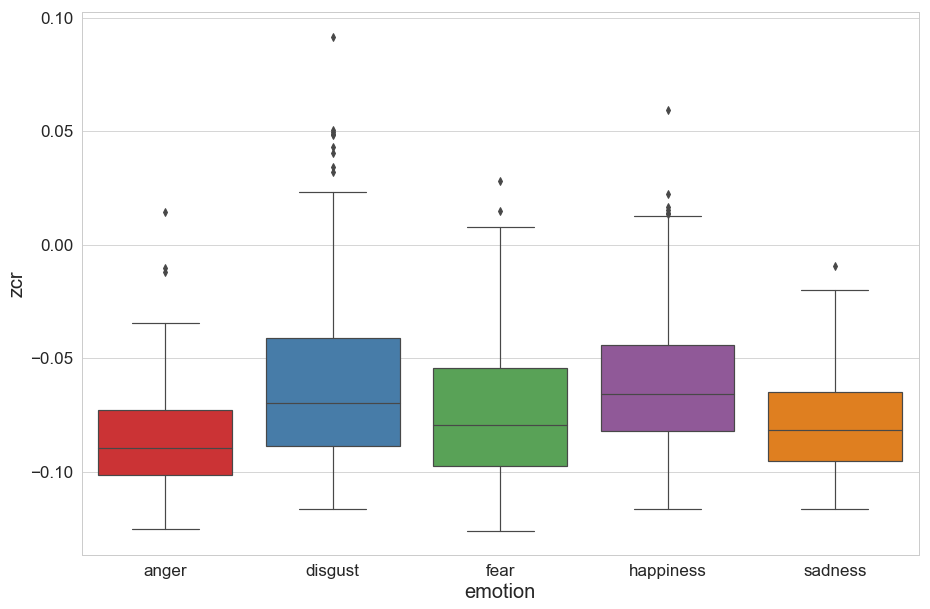

In [21]:
display_boxplot("zcr", df, df_emotions)

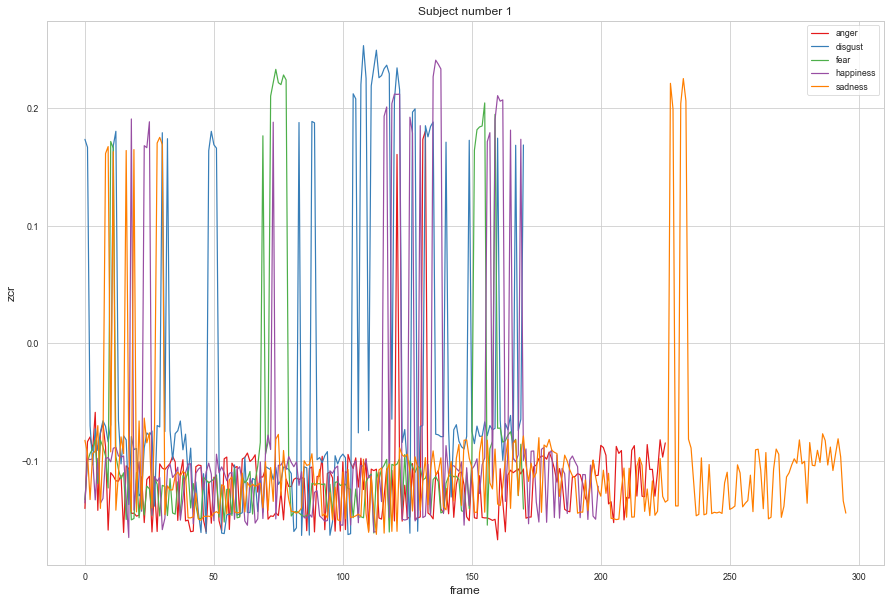

In [22]:
one_subject_one_feature(1, "zcr")

## Energy (energy)

Log-energy indica la amplitud cuadrada total en un segmento del habla. 
Esta característica es simplemente la **cantidad de potencia o volumen normalizado en la señal.**

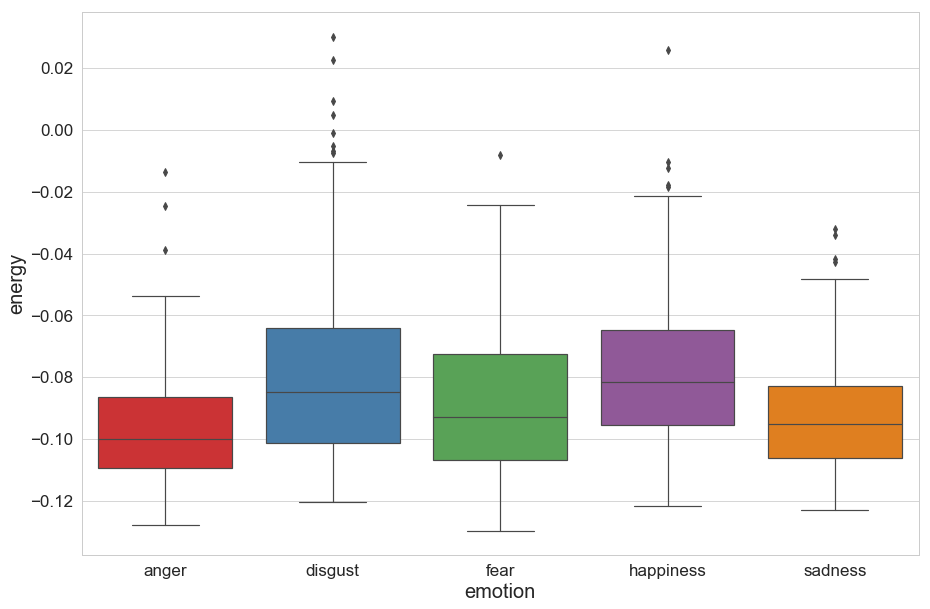

In [23]:
display_boxplot("energy", df, df_emotions)

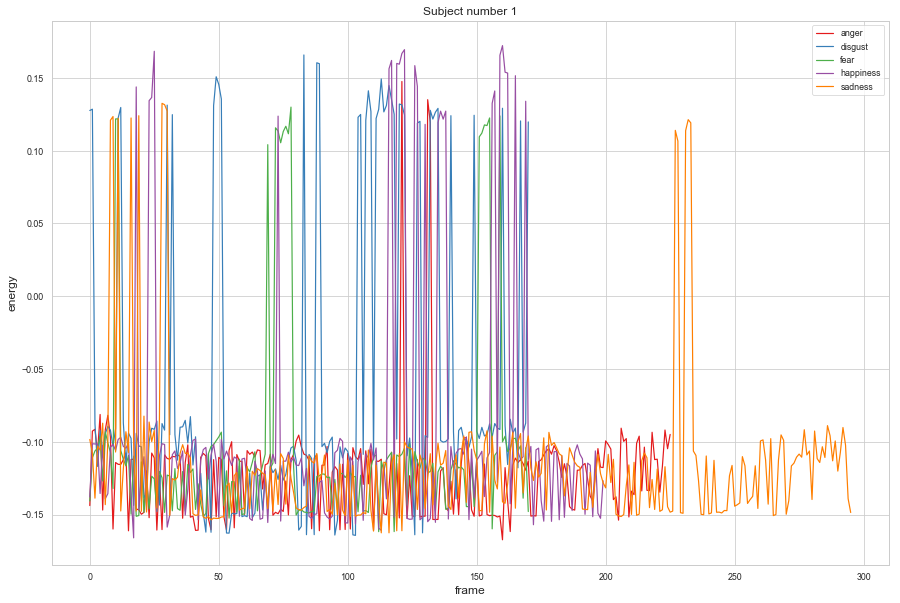

In [24]:
one_subject_one_feature(1, "energy")

## Entropy of Energy (energy_entropy)

La entropía de las energías normalizadas de los sub-frames. Puede interpretarse como una medida de cambios abruptos.

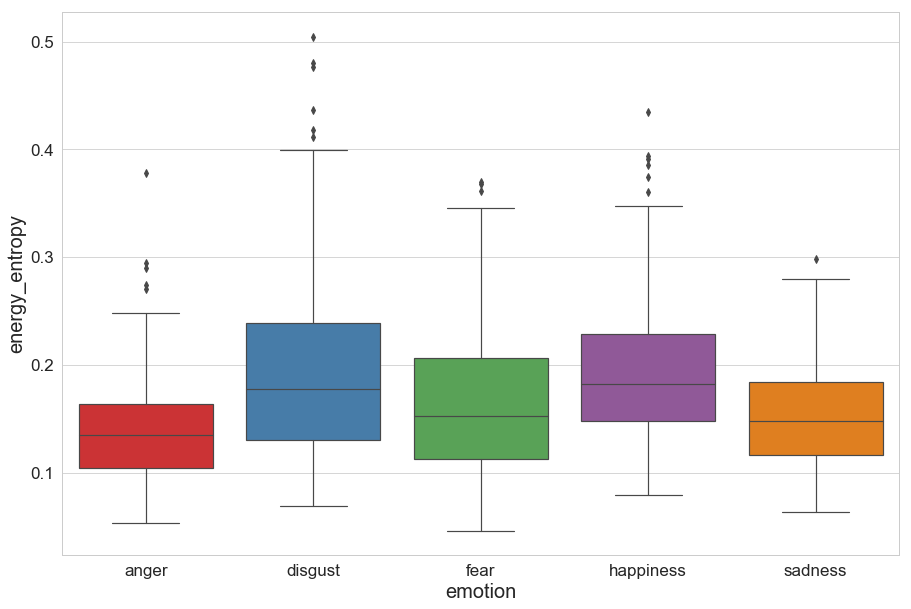

In [25]:
display_boxplot("energy_entropy", df, df_emotions)

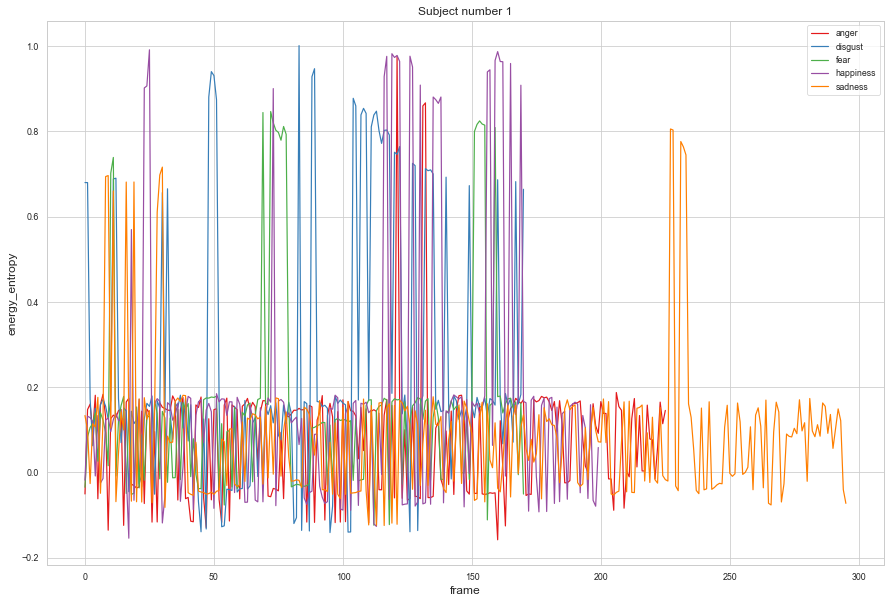

In [26]:
one_subject_one_feature(1, "energy_entropy")

## Pitch (pitch)

El tono puede cuantificarse como una frecuencia, pero el tono no es una propiedad física puramente objetiva; es un atributo psicoacústico subjetivo del sonido.

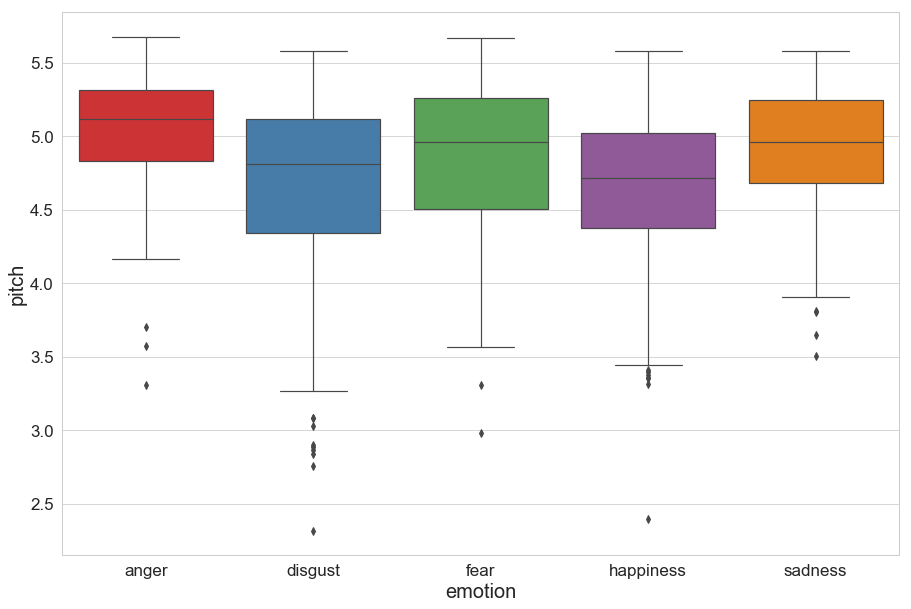

In [27]:
display_boxplot("pitch", df, df_emotions)

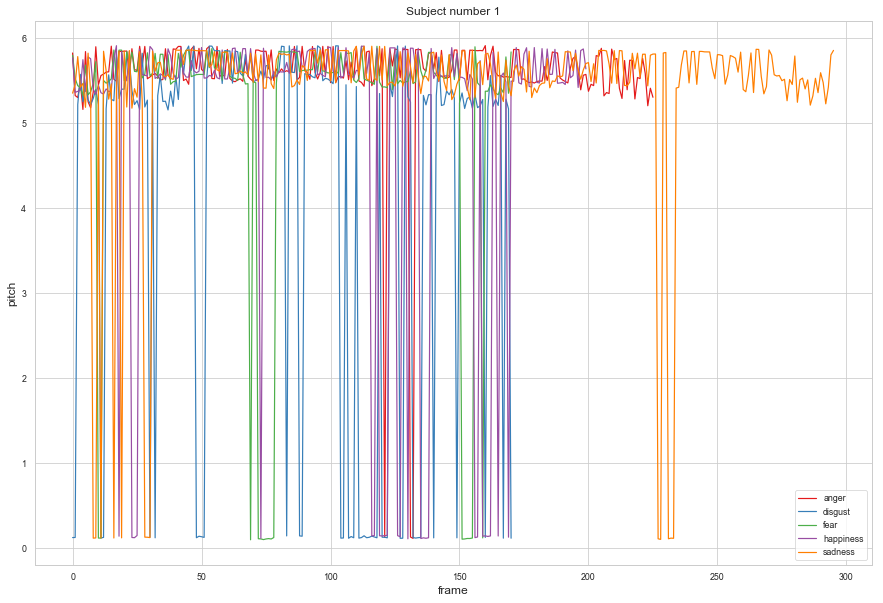

In [28]:
one_subject_one_feature(1, "pitch")

## Harmonic ratio (harmonic_ratio)

El ratio entre la energía en la porción armónica del frame respecto a la total.

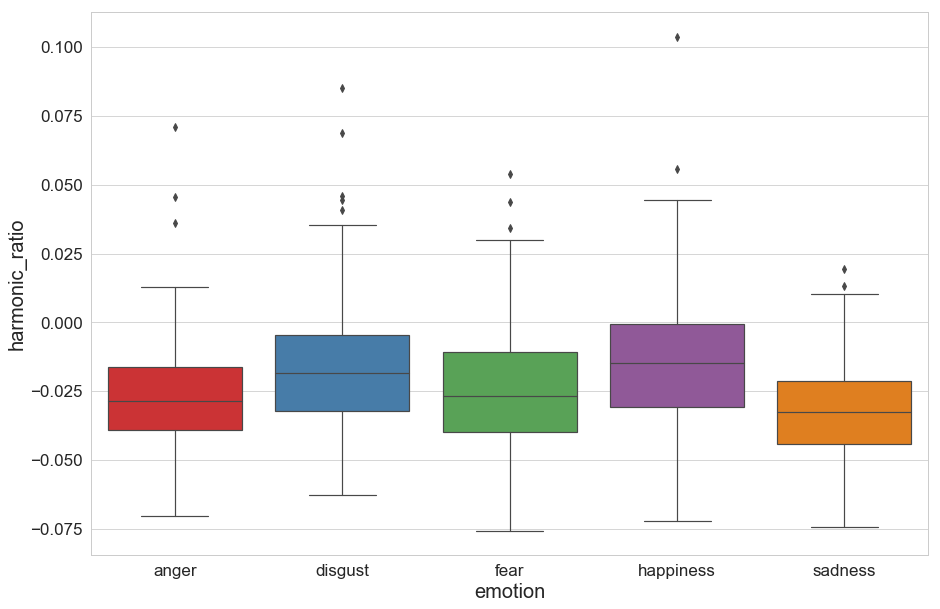

In [29]:
display_boxplot("harmonic_ratio", df, df_emotions)

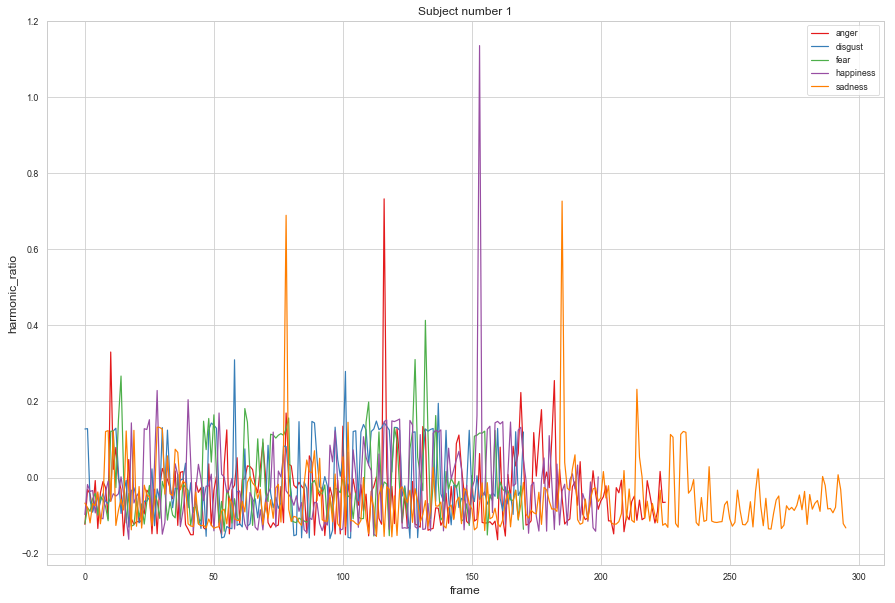

In [30]:
one_subject_one_feature(1, "harmonic_ratio")

# Spectral

## Spectral Centroid (spectral_centroid)

El centro de gravedad del espectro.

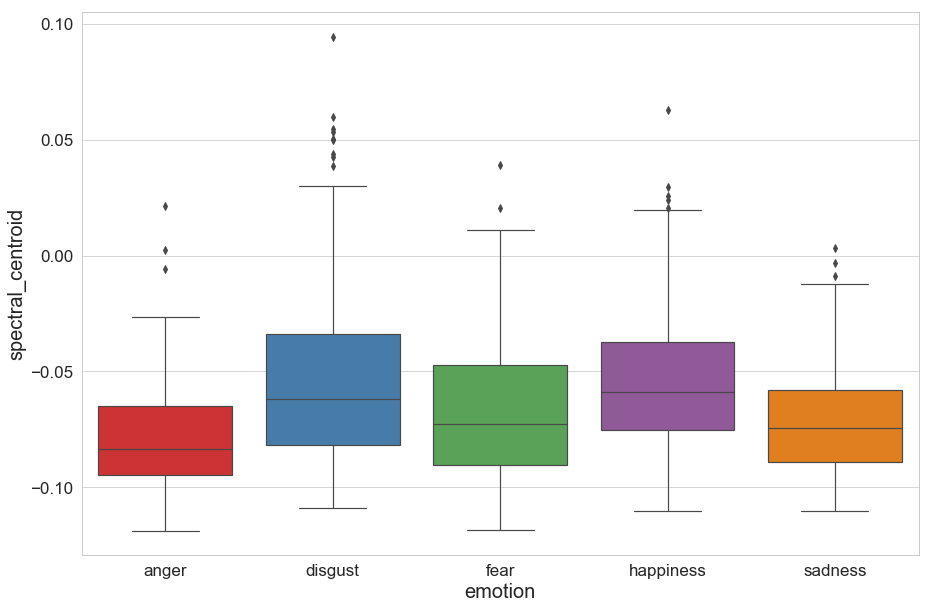

In [31]:
display_boxplot("spectral_centroid", df, df_emotions)

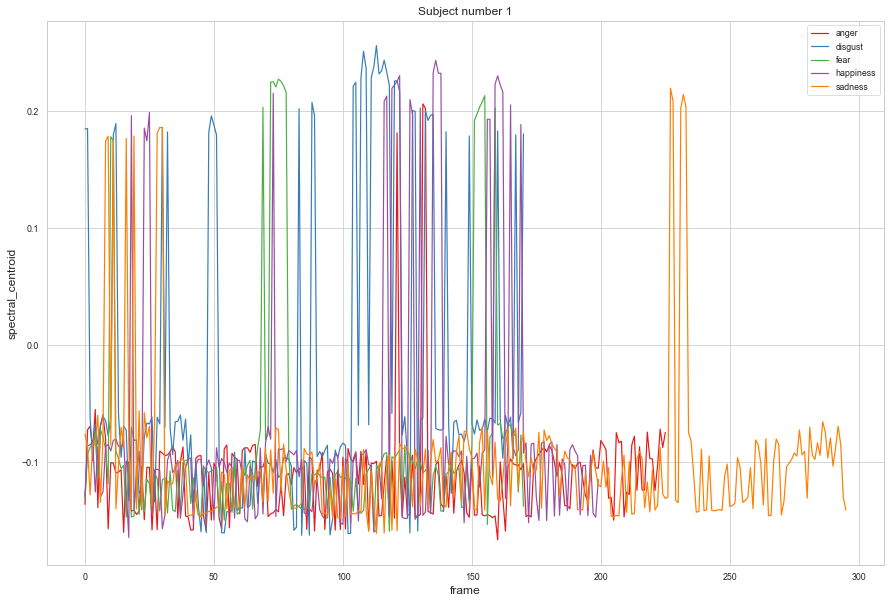

In [32]:
one_subject_one_feature(1, "spectral_centroid")

## Spectral Spread (spectral_spread)

The second central moment of the spectrum.

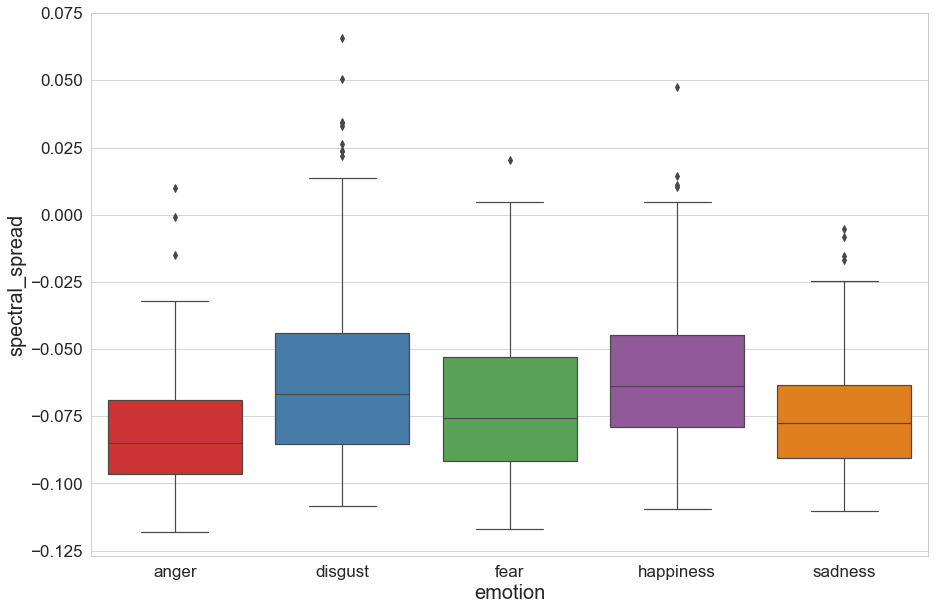

In [33]:
display_boxplot("spectral_spread", df, df_emotions)

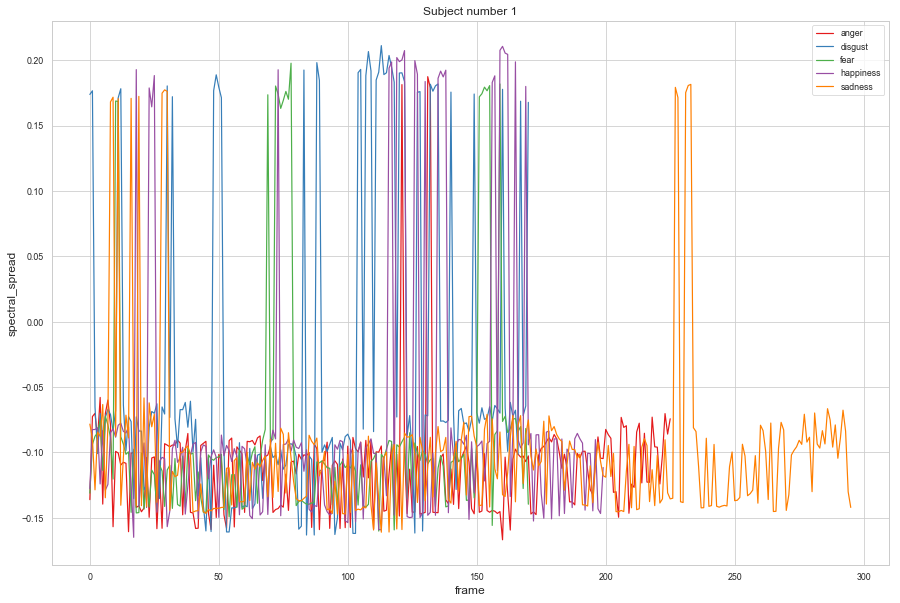

In [34]:
one_subject_one_feature(1, "spectral_spread")

## Spectral Entropy (spectral_entropy)

Entropía de las energías espectrales normalizadas para un conjunto de subframes.

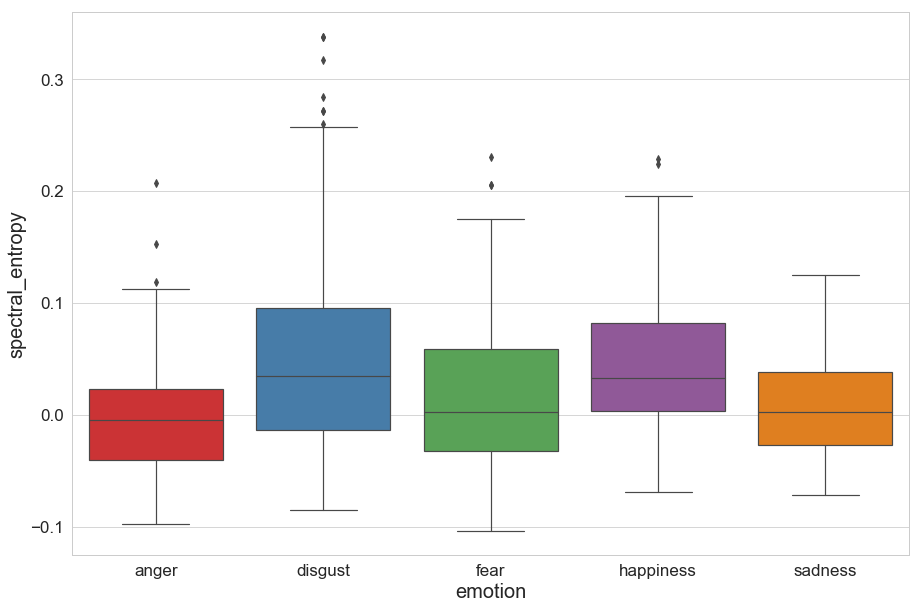

In [35]:
display_boxplot("spectral_entropy", df, df_emotions)

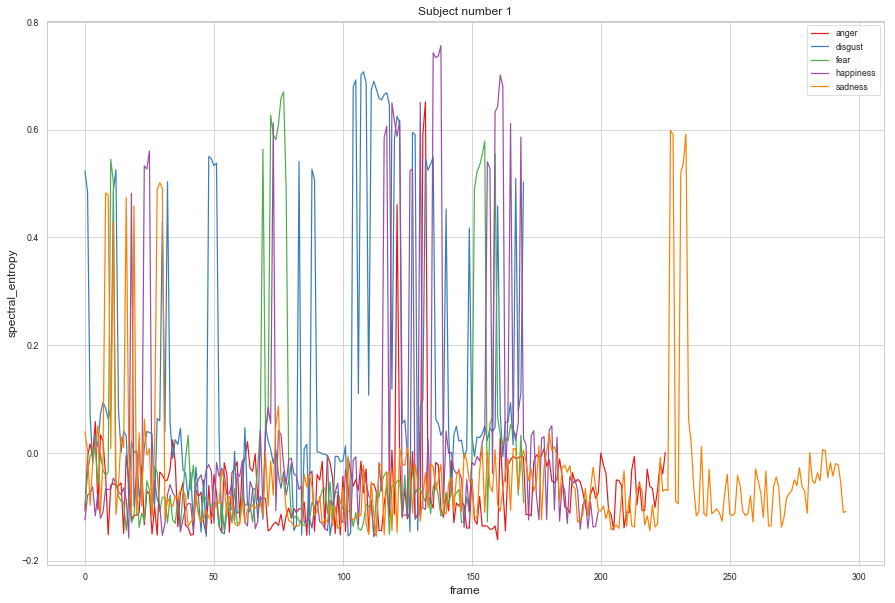

In [36]:
one_subject_one_feature(1, "spectral_entropy")

## Spectral Flux (spectral_flux)

La diferencia al cuadrado entre las magnitudes normalizadas de los espectros de los dos frames sucesivos.

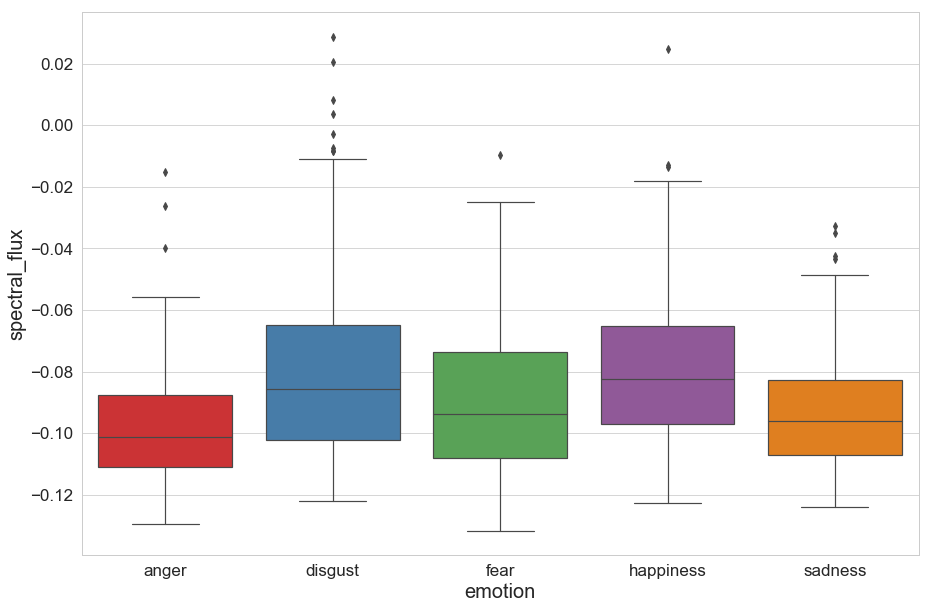

In [37]:
display_boxplot("spectral_flux", df, df_emotions)

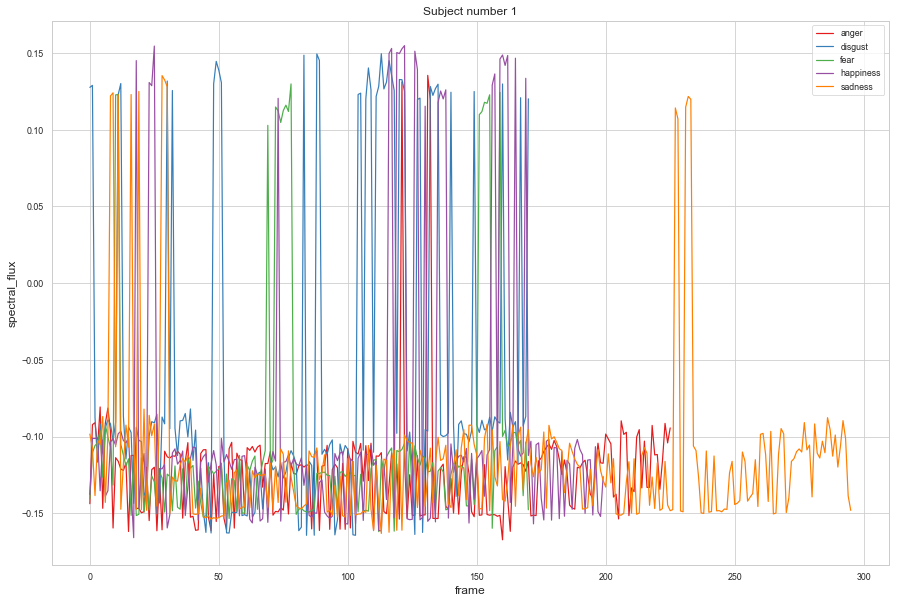

In [38]:
one_subject_one_feature(1, "spectral_flux")

## Spectral Rolloff (spectral_rolloff)

La frecuencia por debajo de la cual se concentra el 90% de la distribución de la magnitud del espectro.

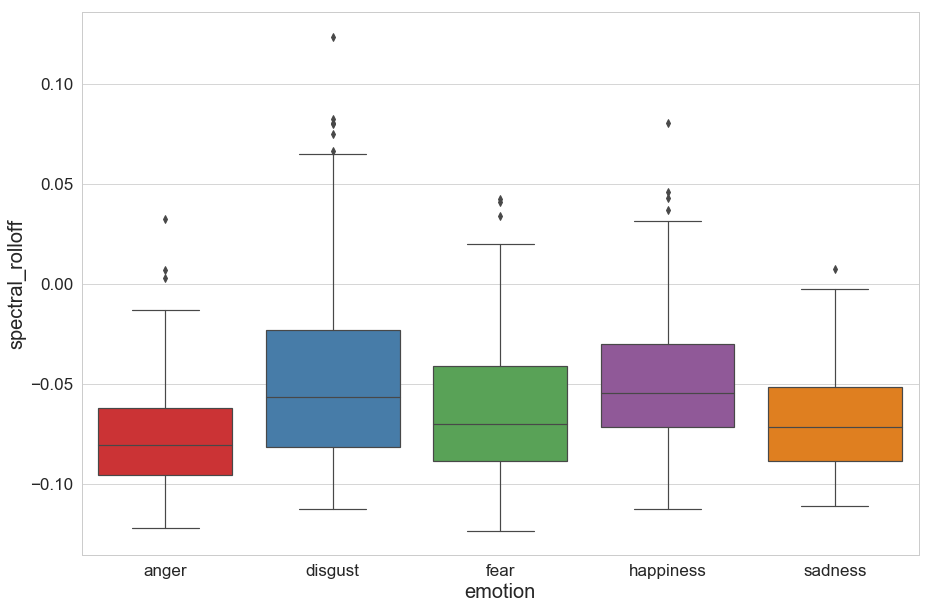

In [39]:
display_boxplot("spectral_rolloff", df, df_emotions)

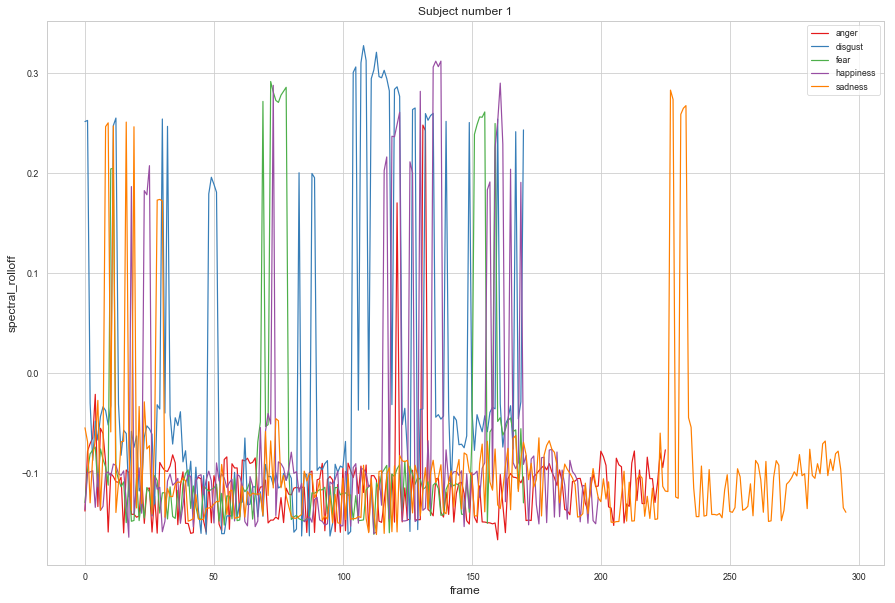

In [40]:
one_subject_one_feature(1, "spectral_rolloff")

## MFCCs  (mfcc_< X >)

Los Mel Frequency Cepstral Coeﬃcients (Coeﬁcientes Cepstrales en las Frecuencias de Mel) o MFCCs **son coeﬁcientes para la representación del habla basados en la percepción auditiva humana**.

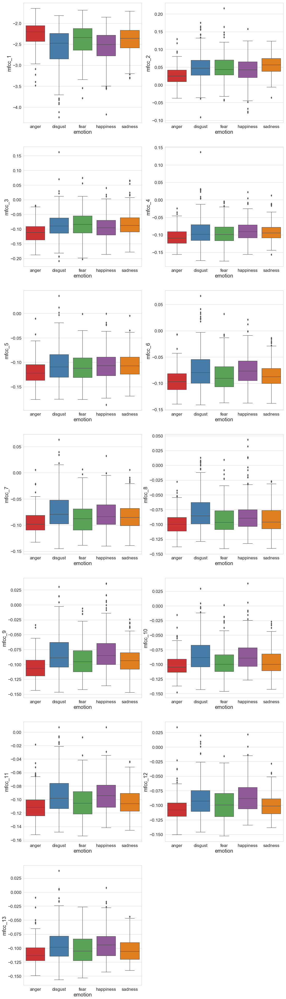

In [41]:
plt.rcParams['figure.figsize'] = (18.0, 70.0)
i=1
for mfcc in label_features[8:21]:
    plt.subplot(7,2,i)
    display_boxplot(mfcc, df, df_emotions)
    i+=1
plt.show()

plt.rcParams['figure.figsize'] = (15.0, 10.0)

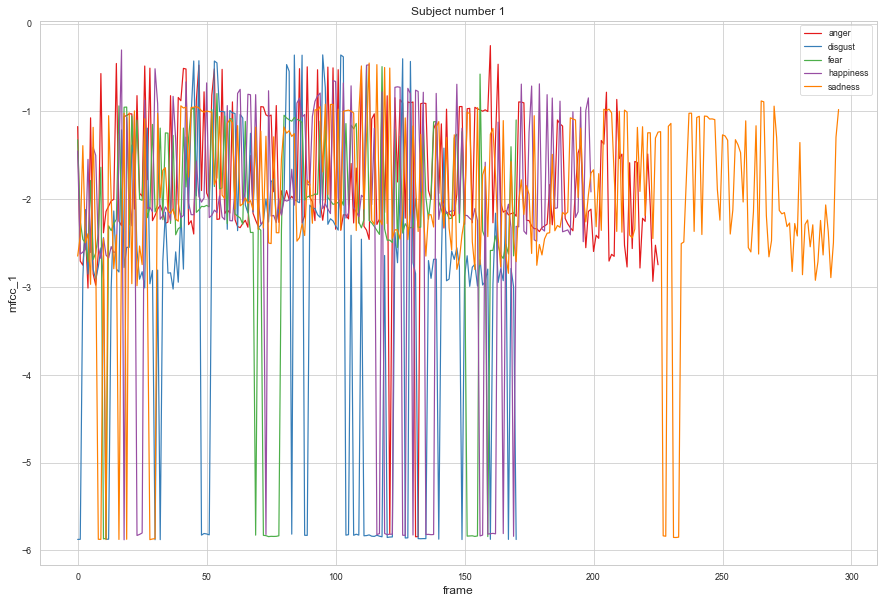

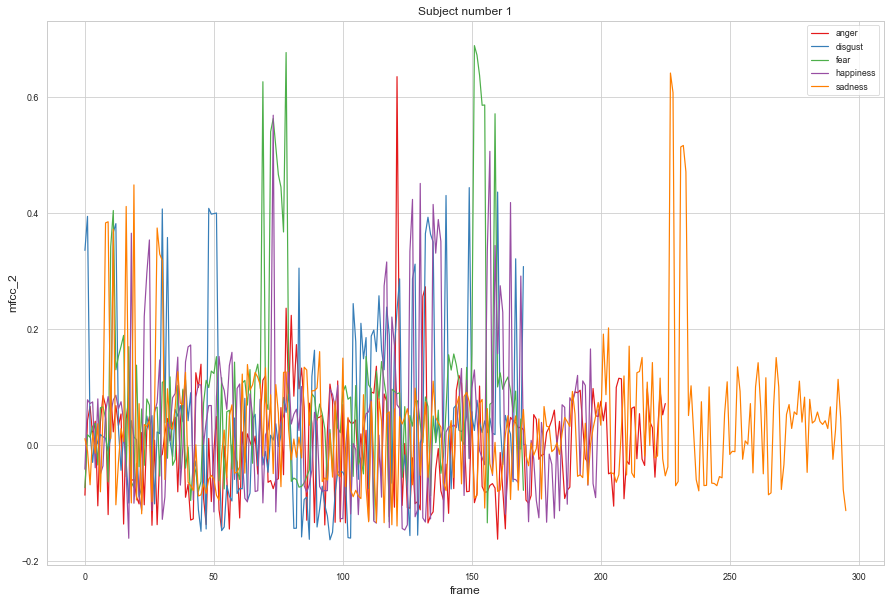

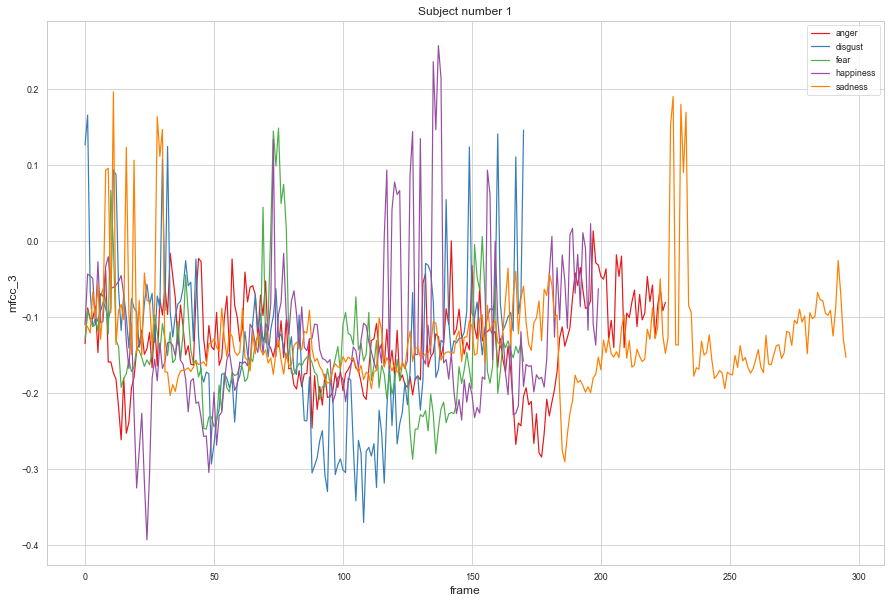

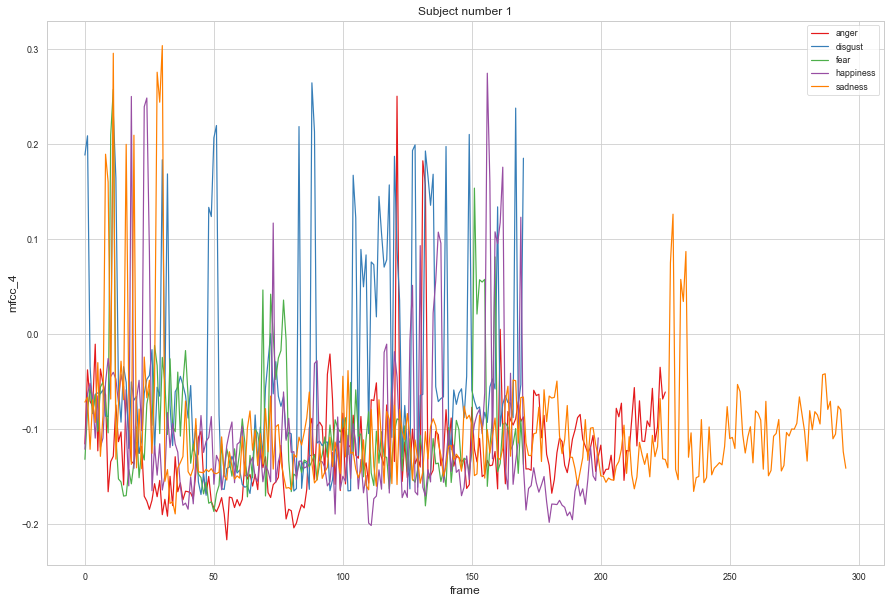

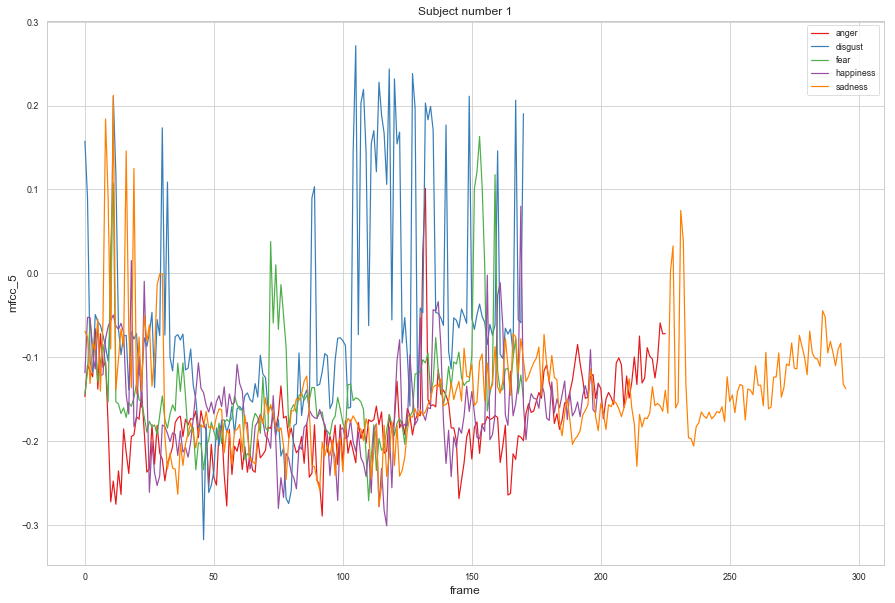

...

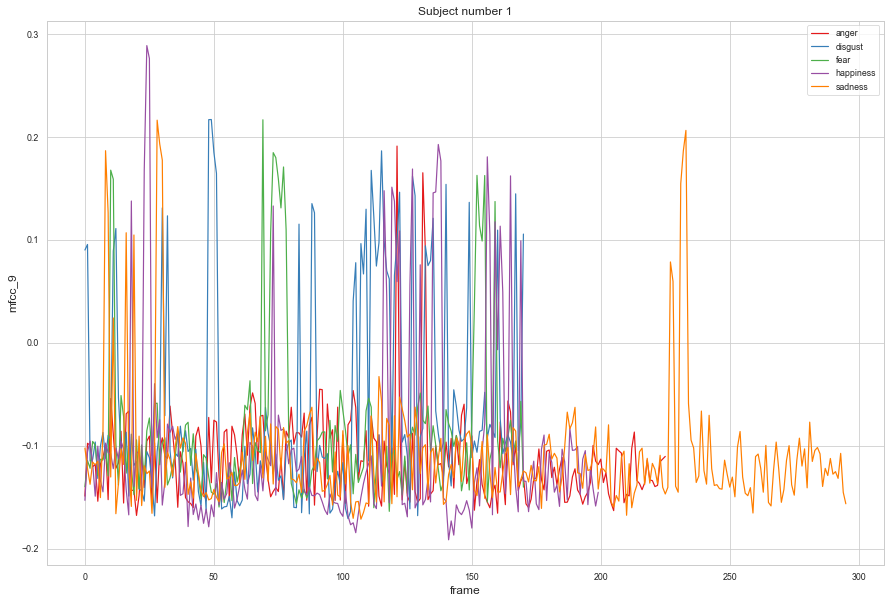

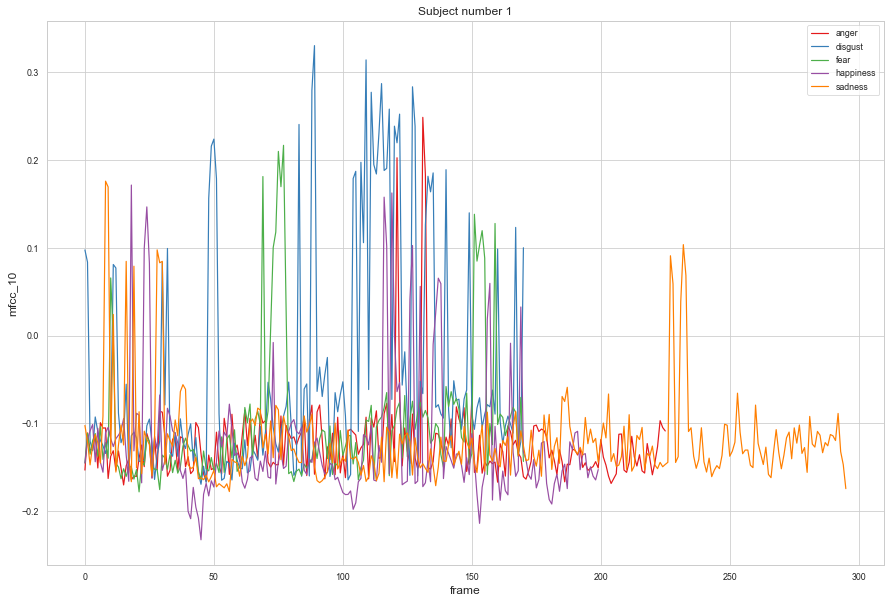

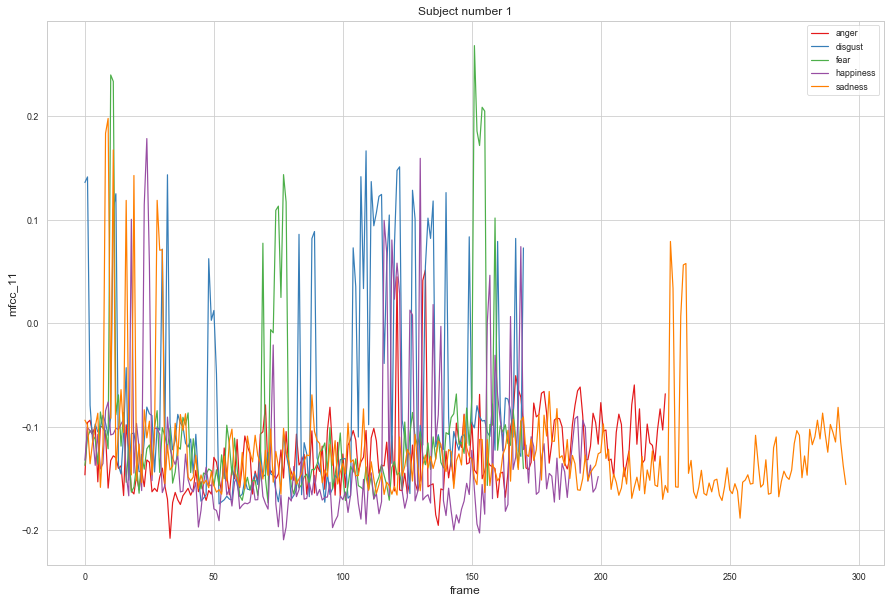

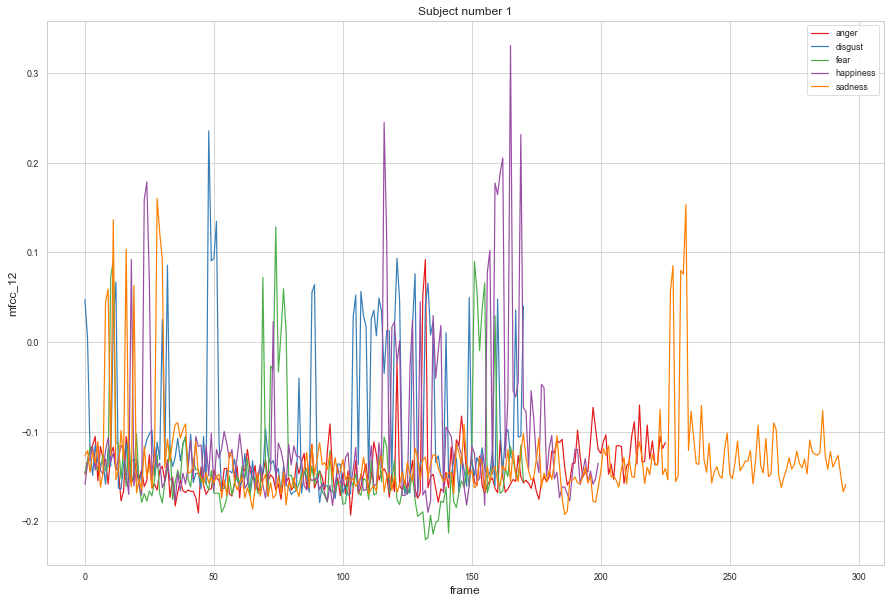

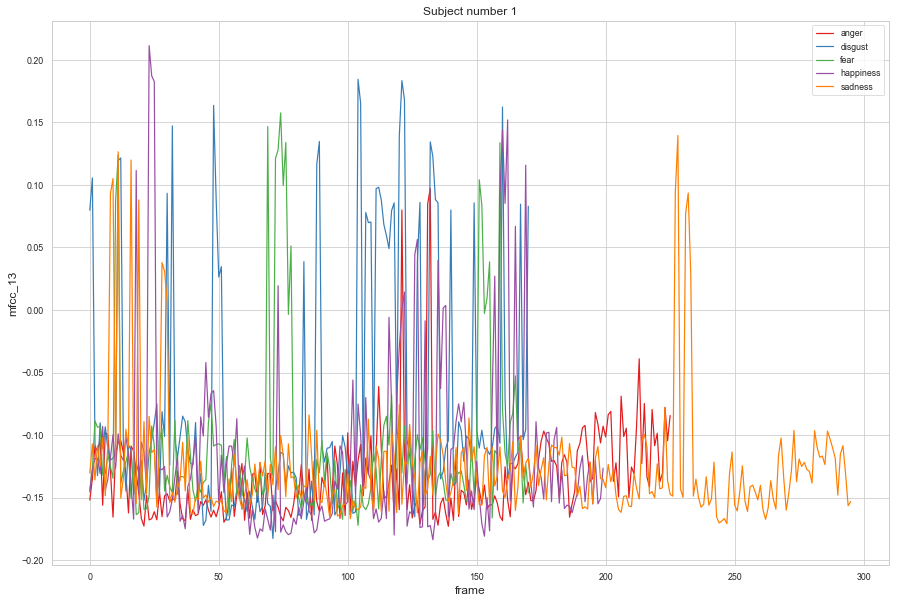

In [42]:
for mfcc in label_features[8:21]:
    one_subject_one_feature(1, mfcc)

## Chroma Vector (chroma_< X >) - Chroma Deviation (chroma_std)

Una representación de 12 elementos de la energía espectral en la que los intervalos **representan las 12 clases de tonos de la música de tipo occidental** (espaciado de semitono).

La desviación estándar de los 12 coeficientes 

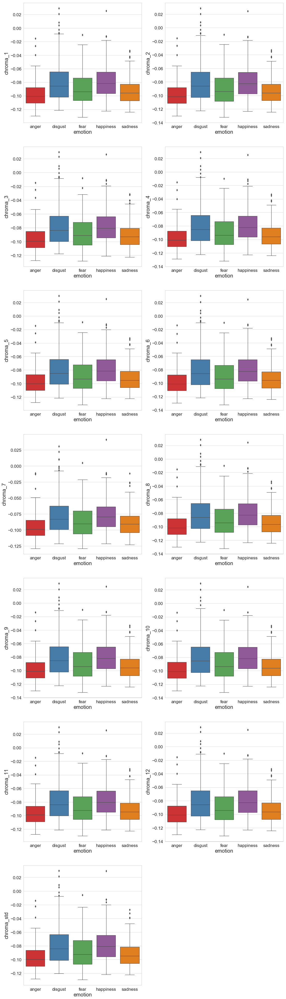

In [43]:
plt.rcParams['figure.figsize'] = (18.0, 70.0)
i=1
for chroma in label_features[21:34]:
    plt.subplot(7,2,i)
    display_boxplot(chroma, df, df_emotions)
    i+=1
plt.show()

plt.rcParams['figure.figsize'] = (15.0, 10.0)

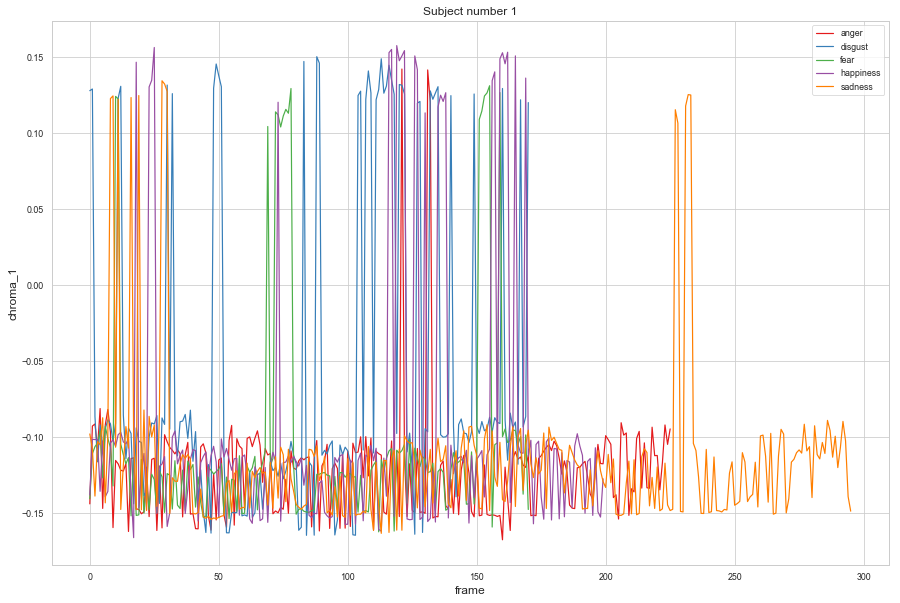

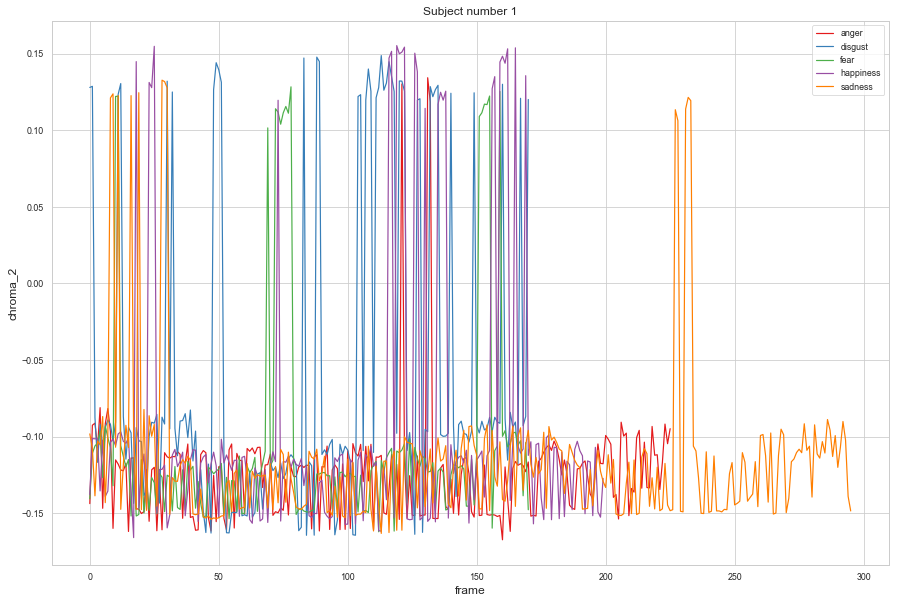

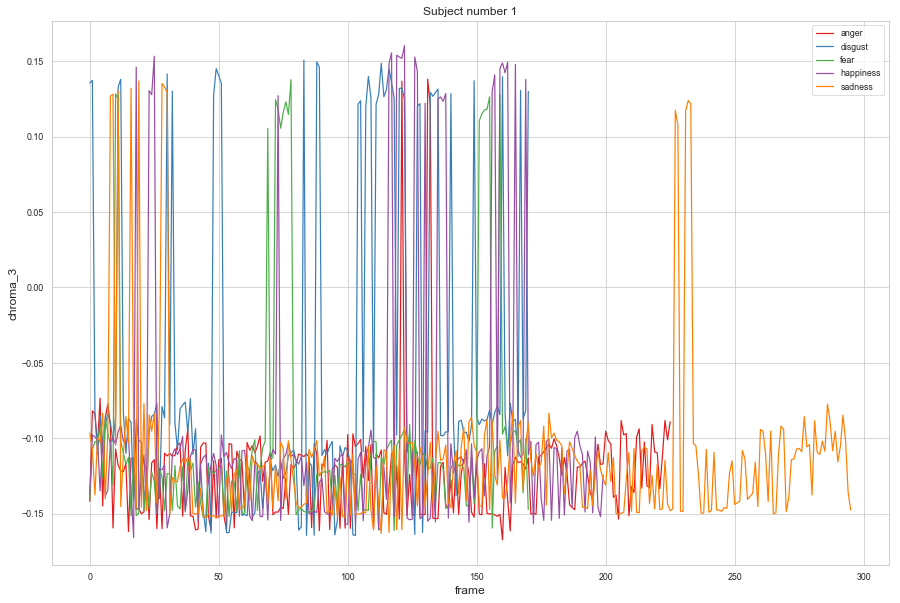

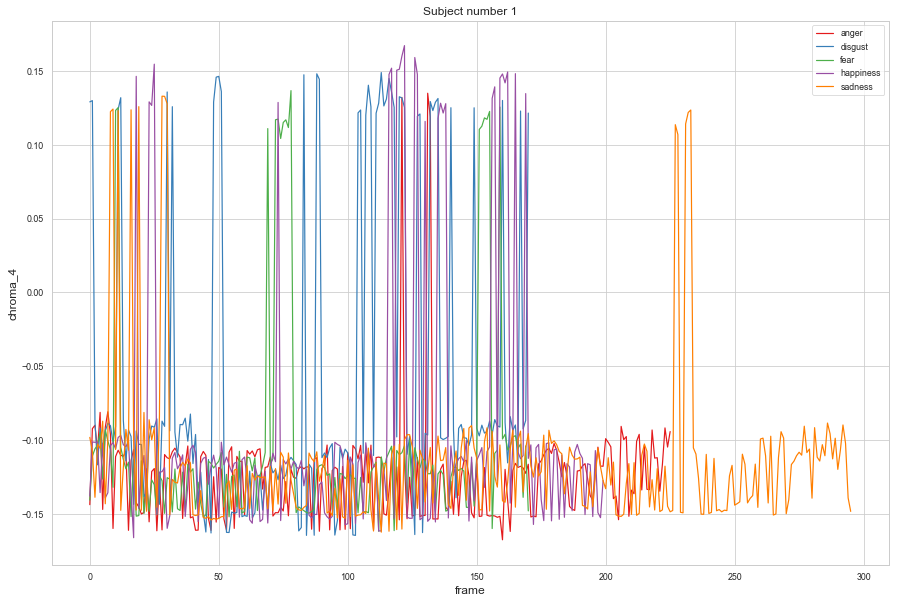

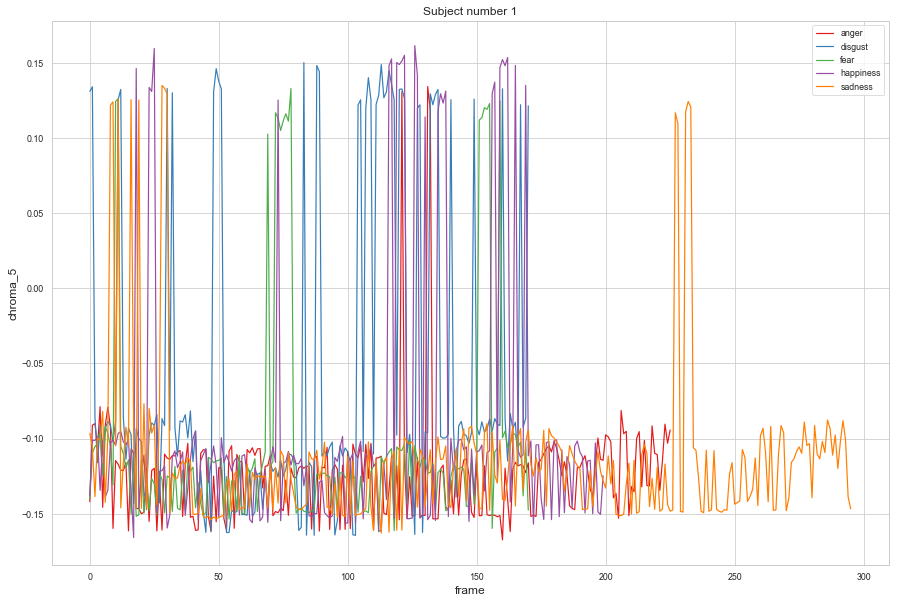

...

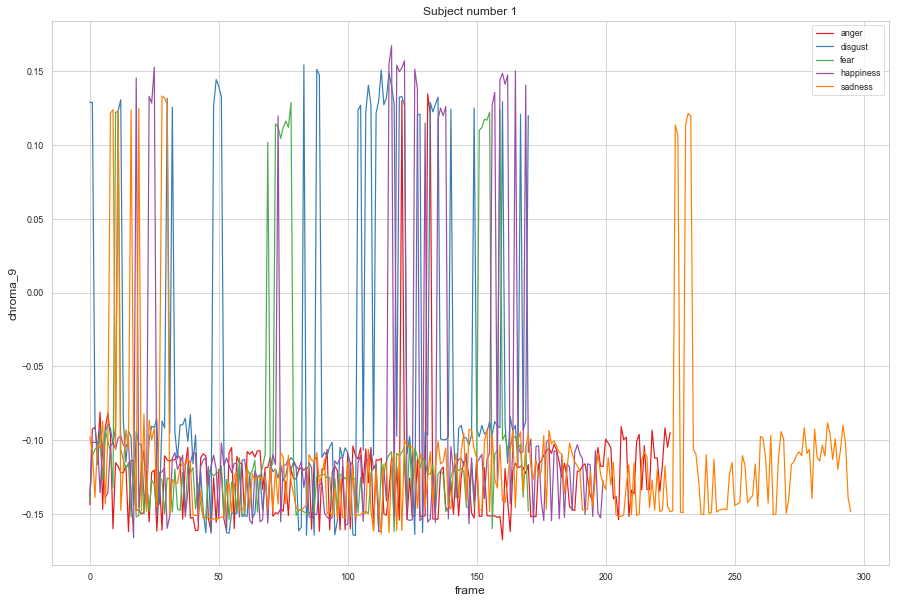

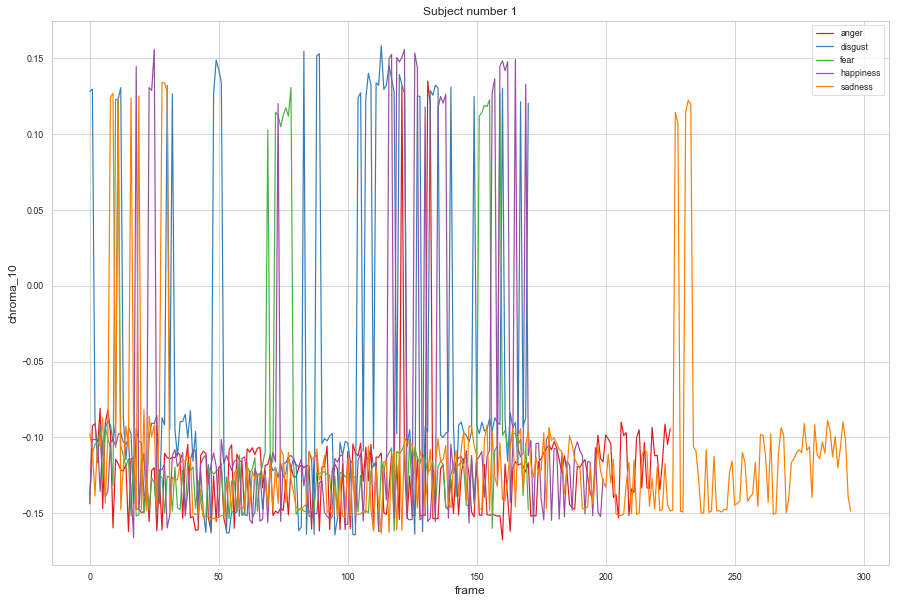

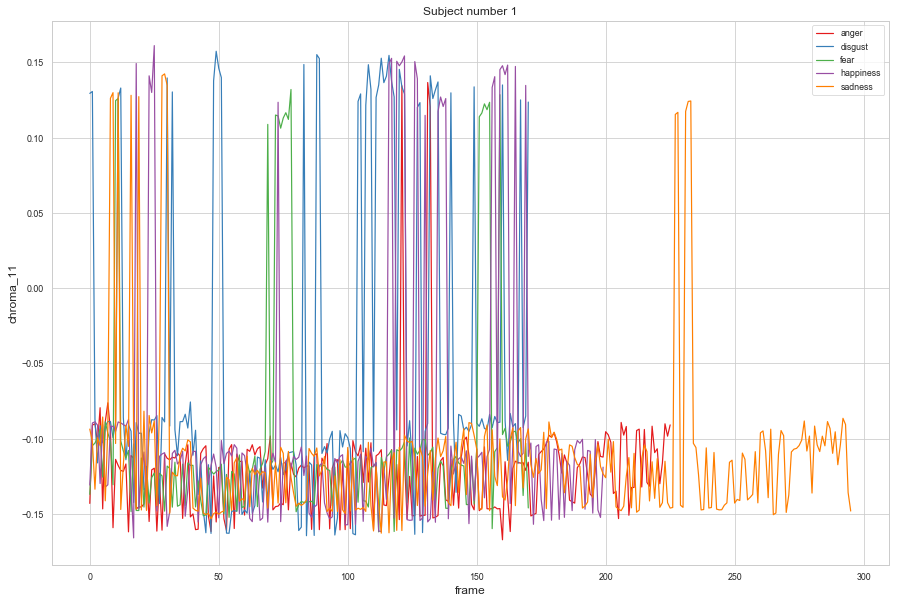

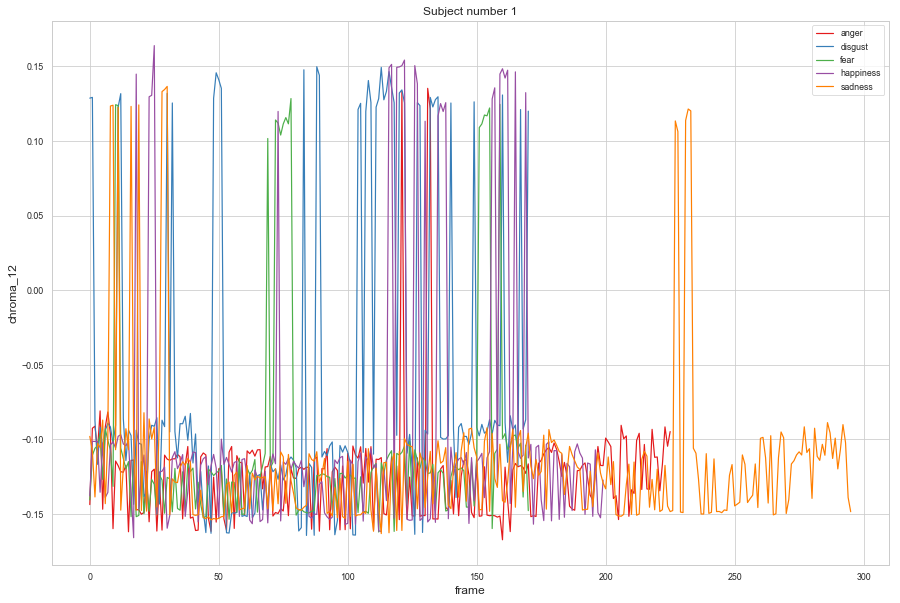

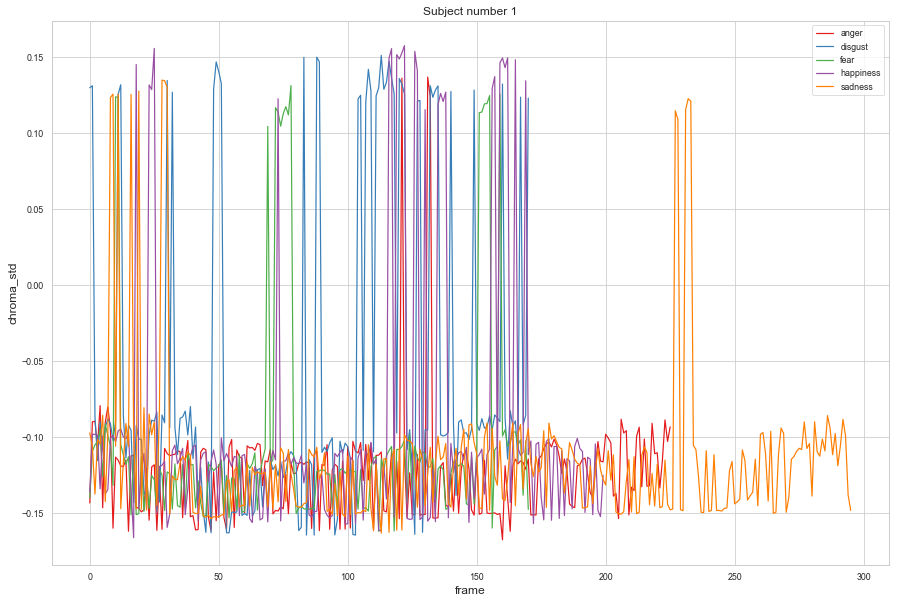

In [44]:
for chroma in label_features[21:34]:
    one_subject_one_feature(1, chroma)
    plt.show()